# Feature Based Transverse Chromatic Aberration Correction
We explore TCA correction by minimizing spatial differences using the cubic forward model.

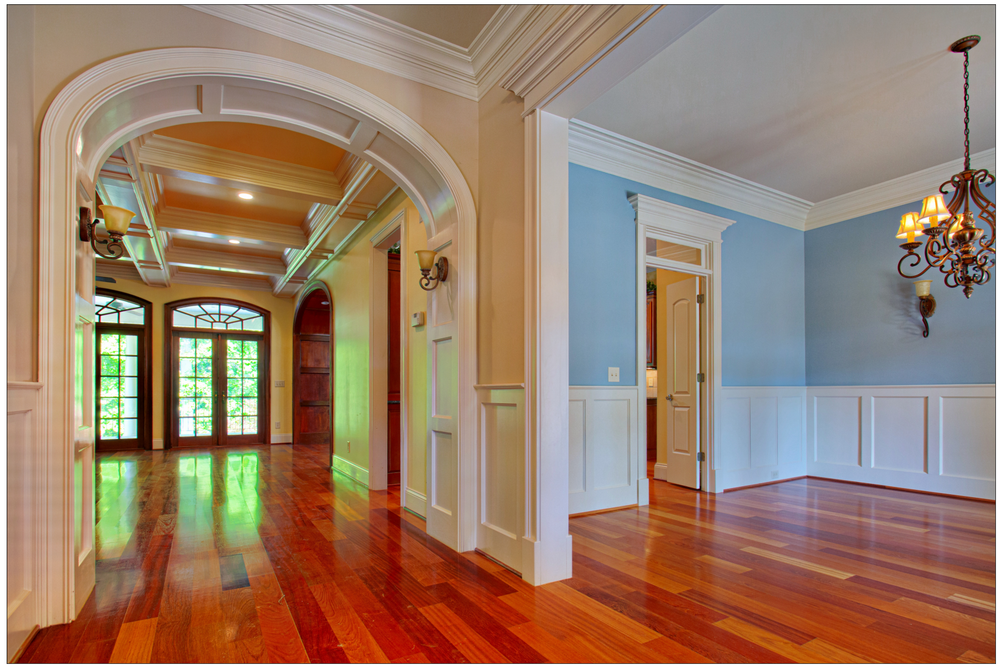

In [2]:
from imageio import imread
from matplotlib import pyplot as plt

# Load image
image = imread("../test/media/tca/1.jpg")

# Show
plt.figure(figsize=(30, 20))
plt.xticks([])
plt.yticks([])
plt.imshow(image, interpolation="bilinear")
plt.show()

Next, we split the image by channels:

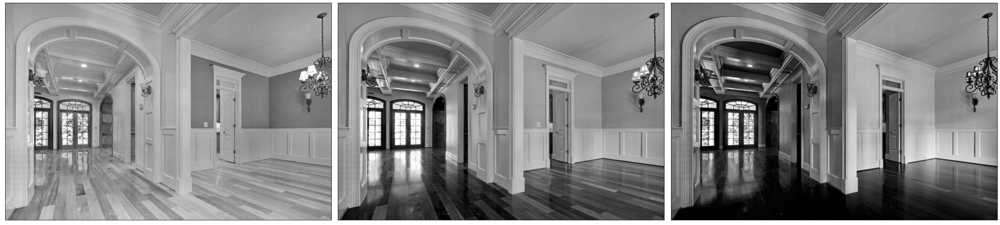

In [18]:
from numpy import split

# Split
r, g, b = split(image, 3, axis=2)

# Plot
plt.figure(figsize=(30, 20))
plt.gray()
plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(r, interpolation="bilinear")
plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(g, interpolation="bilinear")
plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(b, interpolation="bilinear")
plt.tight_layout()
plt.show()

Next, we equalize histograms to aid feature detection:

In [19]:
from numpy import float64, interp, uint8, unique

def histogram_match (input, target):
    # Source: https://stackoverflow.com/questions/32655686/histogram-matching-of-two-images-in-python-2-x
    s_values, bin_idx, s_counts = unique(input.ravel(), return_inverse=True, return_counts=True)
    t_values, t_counts = unique(target.ravel(), return_counts=True)
    s_quantiles = s_counts.cumsum().astype(float64)
    s_quantiles /= s_quantiles[-1]
    t_quantiles = t_counts.cumsum().astype(float64)
    t_quantiles /= t_quantiles[-1]
    interp_t_values = interp(s_quantiles, t_quantiles, t_values)
    result = interp_t_values[bin_idx].reshape(input.shape).astype(uint8)
    return result

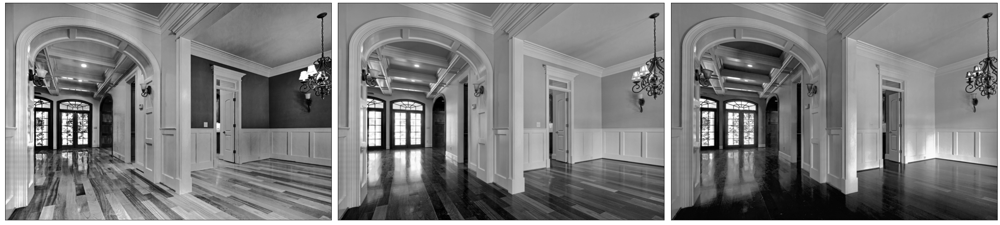

In [20]:
# Match
r = histogram_match(r, g)
b = histogram_match(b, g)

# Plot
plt.figure(figsize=(30, 20))
plt.gray()
plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(r, interpolation="bilinear")
plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(g, interpolation="bilinear")
plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(b, interpolation="bilinear")
plt.tight_layout()
plt.show()

Next, we find matches:

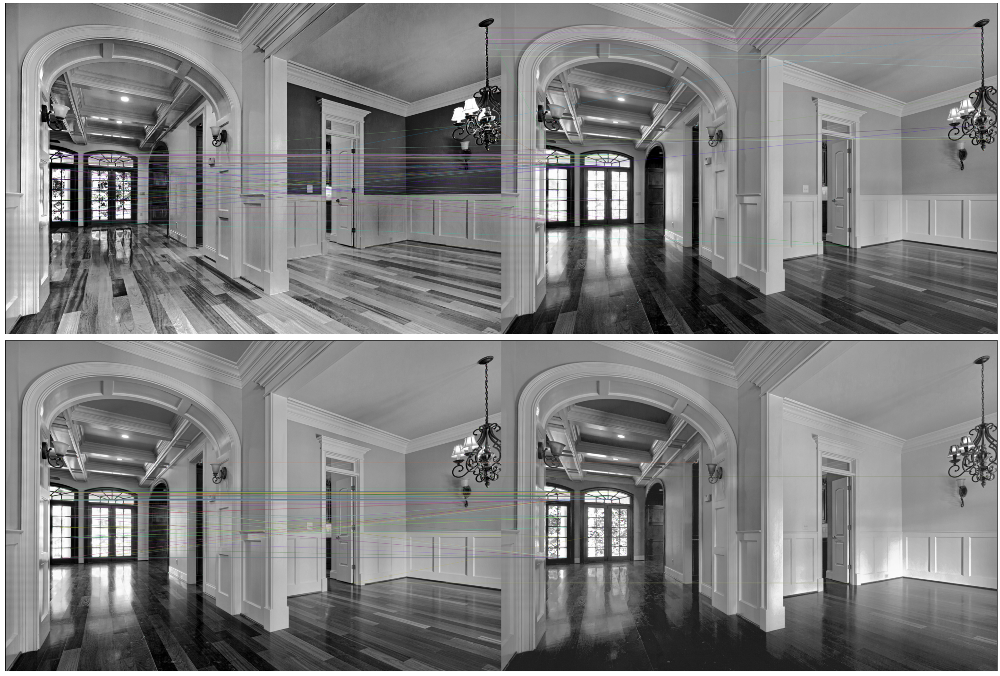

In [23]:
from cv2 import DescriptorMatcher_create, drawMatches, ORB_create, DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING

# Detect features
orb = ORB_create(1000)
keypoints_r, descriptors_r = orb.detectAndCompute(r, None)
keypoints_g, descriptors_g = orb.detectAndCompute(g, None)
keypoints_b, descriptors_b = orb.detectAndCompute(b, None)

# Match features
matcher = DescriptorMatcher_create(DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
matches_rg = matcher.match(descriptors_r, descriptors_g, None)
matches_gb = matcher.match(descriptors_g, descriptors_b, None)

# Extract top k
matches_rg = sorted(matches_rg, key=lambda x: x.distance)
matches_gb = sorted(matches_gb, key=lambda x: x.distance)
matches_rg = matches_rg[:int(len(matches_rg) * 0.15)]
matches_gb = matches_gb[:int(len(matches_gb) * 0.15)]

# Draw matches
image_matches_rg = drawMatches(r, keypoints_r, g, keypoints_g, matches_rg, None)
image_matches_gb = drawMatches(g, keypoints_g, b, keypoints_b, matches_gb, None)
plt.figure(figsize=(30, 20))
plt.subplot(2, 1, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(image_matches_rg, interpolation="bilinear")
plt.subplot(2, 1, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(image_matches_gb, interpolation="bilinear")
plt.tight_layout()
plt.show()